# Interactive plots

Note that this is very messy code and also no comments on the result, but the nice plots and story is on the website afterall *wink*

In [49]:
import plotly.express as px
import pandas as pd
import numpy as np
from collections import Counter
import ast
from plotly.colors import sample_colorscale
import plotly.graph_objects as go
import plotly.colors

# Initate cleaned dataframe

In [50]:
MOVIES = pd.read_csv("cleaned_data.csv")
MOVIES.head()

,Unnamed: 0,wikipedia_movie_ID,name,release_date,revenue,runtime,languages,countries,genres,release_year,...,sentiment,Character Count,Female actor count,Male actor count,N/A actor count,Actors 0-20,Actors 20-30,Actors 30-40,Actors 40-60,Actors 60+
0,0,975900,ghosts of mars,2001-08-24,14010832.0,98.0,"{""/m/02h40lc"": ""English Language""}","{""/m/09c7w0"": ""United States of America""}","{""/m/01jfsb"": ""Thriller"", ""/m/06n90"": ""Science...",2001.0,...,-0.085095,17,6,11,0,0,2,3,7,5
1,1,3196793,getting away with murder: the jonbenét ramsey ...,2000-02-16,0.0,95.0,"{""/m/02h40lc"": ""English Language""}","{""/m/09c7w0"": ""United States of America""}","{""/m/02n4kr"": ""Mystery"", ""/m/03bxz7"": ""Biograp...",2000.0,...,-0.050000,15,4,11,0,1,0,1,6,7
2,2,13696889,the gangsters,1913-05-29,0.0,35.0,"{""/m/06ppq"": ""Silent film"", ""/m/02h40lc"": ""Eng...","{""/m/09c7w0"": ""United States of America""}","{""/m/02hmvc"": ""Short Film"", ""/m/06ppq"": ""Silen...",1913.0,...,0.600000,1,0,1,0,0,0,0,0,1
3,3,10408933,alexander's ragtime band,1938-08-16,3600000.0,106.0,"{""/m/02h40lc"": ""English Language""}","{""/m/09c7w0"": ""United States of America""}","{""/m/04t36"": ""Musical"", ""/m/01z4y"": ""Comedy"", ...",1938.0,...,0.441667,4,2,2,0,0,2,2,0,0
4,4,6631279,little city,1997-04-04,0.0,93.0,"{""/m/02h40lc"": ""English Language""}","{""/m/09c7w0"": ""United States of America""}","{""/m/06cvj"": ""Romantic comedy"", ""/m/0hj3n0w"": ...",1997.0,...,0.165202,6,4,2,0,0,1,4,1,0


In [51]:
MOVIES.columns

Index(['Unnamed: 0', 'wikipedia_movie_ID', 'name', 'release_date', 'revenue',
       'runtime', 'languages', 'countries', 'genres', 'release_year',
       'vote_average', 'vote_count', 'adult', 'budget', 'popularity', 'plot',
       'original_genres', 'new_genres', 'genre_hot', 'death', 'love',
       'tragedy', 'violence', 'betrayal', 'friendship', 'happiness', 'fear',
       'revenge', 'justice', 'hope', 'family', 'fate', 'greed', 'survival',
       'transformation', 'sentiment', 'Character Count', 'Female actor count',
       'Male actor count', 'N/A actor count', 'Actors 0-20', 'Actors 20-30',
       'Actors 30-40', 'Actors 40-60', 'Actors 60+'],
      dtype='object')

# Num movies per genre

In [52]:
unique_genre = list()
MOVIES["new_genres"].apply(lambda x: unique_genre.extend(ast.literal_eval(x)))
unique_genre = Counter(unique_genre)
unique_genre = {k: v for k, v in sorted(unique_genre.items(), key=lambda item: item[1], reverse=True)}
unique_genre["Other"] = 0
for idx, entry in enumerate(unique_genre):
    if idx>15 and entry != 'Other':
        unique_genre['Other'] += unique_genre[entry]
        unique_genre[entry] = 0
unique_genre = {x:y for x,y in unique_genre.items() if y!=0}
unique_genre = pd.DataFrame.from_dict(unique_genre, orient='index')
unique_genre = unique_genre.rename(columns={'index':'genre', 0:'count'})
unique_genre = unique_genre


colors = plotly.colors.qualitative.Plotly.copy()
colors.insert(0, 'lightgrey')
print(colors)
fig = px.pie(unique_genre, values='count', names=unique_genre.index, title='Number of movie per genre', color_discrete_sequence=colors)
fig.show()
#fig.write_html("num_movies.html", auto_open=False)

['lightgrey', '#636EFA', '#EF553B', '#00CC96', '#AB63FA', '#FFA15A', '#19D3F3', '#FF6692', '#B6E880', '#FF97FF', '#FECB52']


# Themes in genre

In [53]:
import plotly.graph_objects as go
import numpy as np
import pandas as pd
import plotly.colors as pc

theme_columns = ['death', 'love',
       'tragedy', 'violence', 'betrayal', 'friendship', 'happiness', 'fear',
       'revenge', 'justice', 'hope', 'family', 'fate', 'greed', 'survival',
       'transformation']

unique_genre = list()
MOVIES["new_genres"].apply(lambda x: unique_genre.extend(ast.literal_eval(x)))
unique_genre = list(set(unique_genre))
df_themes = MOVIES[theme_columns + ['new_genres']]
dict_themes = {}
for genre in unique_genre:
    df_temp = df_themes[df_themes["new_genres"].apply(lambda x: genre in x)]
    dict_themes[genre] = df_temp[theme_columns].mean().values

df_themes = pd.DataFrame.from_dict(dict_themes, orient="index")
df_themes = df_themes.set_axis(theme_columns, axis=1)


fig = go.Figure()

for idx, genre in enumerate(df_themes.index.values):
    df = df_themes.loc[df_themes.index == genre]
    fig.add_trace(go.Pie(
        labels=df.columns.str.capitalize().values,
        values=np.round(df.values[0], 3),
        name=genre,
        visible=(idx == 0)
    ))

fig.update_layout(
    updatemenus=[
        dict(
            buttons=[
                dict(
                    label=genre,
                    method='update',
                    args=[
                        {'visible': [i == idx for i in range(len(df_themes.index.values))]},
                        {'title': f"Genre: {genre}"}  
                    ]
                )
                for idx, genre in enumerate(df_themes.index.values)
            ],
            direction='down',
            showactive=True
        )
    ]
)


fig.update_traces(
    hoverinfo='label+percent',
    textinfo='value',
    textfont_size=20,
    marker=dict(colors=plotly.colors.qualitative.Plotly, line=dict(color='#000000', width=2))
)
fig.update_layout(
    title="Themes in genres",
    legend=dict(
        x=-0.8,  
        y=0.9, 
        title="Topic"  
    ),
    width=800,
    height=800
)


fig.show()

# Save as HTML
#fig.write_html("topic_genre.html", auto_open=False)

# Age ditribution per genre

In [54]:
import plotly.graph_objects as go
import numpy as np
import pandas as pd

age_columns = [ 'Actors 0-20', 'Actors 20-30', 'Actors 30-40', 'Actors 40-60', 'Actors 60+']
unique_genre = list()
MOVIES["new_genres"].apply(lambda x: unique_genre.extend(ast.literal_eval(x)))
unique_genre = list(set(unique_genre))
df_age = MOVIES[age_columns + ['new_genres']]
dict_themes = {}
for genre in unique_genre:
    df_temp = df_age[df_age["new_genres"].apply(lambda x: genre in x)]
    dict_themes[genre] = df_temp[age_columns].mean().values


df_age = pd.DataFrame.from_dict(dict_themes, orient="index")
df_age = df_age.set_axis(age_columns, axis=1)

fig = go.Figure()

for idx, age in enumerate(df_age.index.values):
    df = df_age.loc[df_age.index == age]
    fig.add_trace(go.Pie(
        hole=0.3,
        labels=df.columns.str.capitalize().values,
        values=np.round(df.values[0], 3),
        name=age,
        visible=(idx == 0) 
    ))

fig.update_layout(
    updatemenus=[
        dict(
            buttons=[
                dict(
                    label=age,
                    method='update',
                    args=[
                        {'visible': [i == idx for i in range(len(df_age.index.values))]},  
                        {'title': f"Genre: {age}"} 
                    ]
                )
                for idx, age in enumerate(df_age.index.values)
            ],
            direction='down',
            showactive=True
        )
    ]
)

fig.update_traces(
    hoverinfo='label+percent',
    textinfo='value',
    textfont_size=20,
    marker=dict(colors=plotly.colors.qualitative.Plotly, line=dict(color='#000000', width=2))
)

fig.update_layout(
    margin=dict(l=20, r=20, t=50, b=20),
    title="Genres"
)

fig.show()

# Save as HTML
#fig.write_html("age_genre_pie.html", auto_open=False)

# Ditribution per age group

In [55]:
age_columns = [ 'Actors 0-20', 'Actors 20-30', 'Actors 30-40', 'Actors 40-60', 'Actors 60+']
unique_genre = list()
MOVIES["new_genres"].apply(lambda x: unique_genre.extend(ast.literal_eval(x)))
unique_genre = list(set(unique_genre))
df_age = MOVIES[age_columns + ['new_genres']]
dict_themes = {}
for genre in unique_genre:
    df_temp = df_age[df_age["new_genres"].apply(lambda x: genre in x)]
    dict_themes[genre] = df_temp[age_columns].mean().values


df_age = pd.DataFrame.from_dict(dict_themes, orient="index")
df_age = df_age.set_axis(age_columns, axis=1)
df_age = df_age.div(df_age.sum(axis=1), axis=0)


fig = go.Figure()


for age in age_columns:
    fig.add_trace(go.Bar(
        name=age,
        x=df_age.index,
        y=df_age[age],
        text=df_age[age].apply(lambda x: f'{100*x:.2f}%'),
        hoverinfo='text', 
        visible=True,  
        textposition='none'
    ))

buttons = []

buttons.append(dict(
    label='All Age Groups',
    method='update',
    args=[
        {'visible': [True] * len(age_columns)},
        {'title': 'Distribution for All Age Groups'}  
    ]
))

for idx, age in enumerate(age_columns):
    buttons.append(dict(
        label=age,
        method='update',
        args=[
            {'visible': [i == idx for i in range(len(age_columns))]},  
            {'title': f"Distribution for {age}"}  
        ]
    ))




fig.update_layout(
    updatemenus=[
        dict(
            buttons=buttons,
            direction='down',
            showactive=True
        )
    ],
    barmode='stack',  
    height=800,
    title="Distribution for All Age Groups",
    xaxis_title="Genres",
    yaxis_title="Proportion",
    legend_title="Age Groups",
)

fig.show()
fig.write_html("age_genre_bar.html", auto_open=False)

# Age distribution *click on the scroll down button to see*

In [56]:
import pandas as pd
import ast
import plotly.graph_objects as go
import plotly.subplots as sp

gender_columns = ['Female actor count', 'Male actor count']
unique_genre = []

MOVIES["new_genres"].apply(lambda x: unique_genre.extend(ast.literal_eval(x)))
unique_genre = list(set(unique_genre))

fig = sp.make_subplots(rows=1, cols=2, shared_yaxes=True)

for idx, genre in enumerate(unique_genre):
    df_temp = MOVIES[MOVIES["new_genres"].apply(lambda x: genre in ast.literal_eval(x))]
    df_temp = df_temp[gender_columns]
    df_long = df_temp.melt(value_vars=gender_columns, 
                           var_name='Gender', 
                           value_name='Count')

    fig.add_trace(go.Violin(
        x=df_long[df_long['Gender'] == 'Female actor count']['Gender'], 
        y=df_long[df_long['Gender'] == 'Female actor count']['Count'],   
        name="Female",
        box=dict(visible=True),
        meanline=dict(visible=True),
        points="outliers",
        fillcolor="plum",
        line_color="purple",
        visible=False
    ), row=1, col=1)

    fig.add_trace(go.Violin(
        x=df_long[df_long['Gender'] == 'Male actor count']['Gender'],  
        y=df_long[df_long['Gender'] == 'Male actor count']['Count'],   
        name="Male",
        box=dict(visible=True),
        meanline=dict(visible=True),
        points="outliers",
        fillcolor="lightblue",
        line_color="darkblue",
        visible=False
    ), row=1, col=2)

dropdown_buttons = [
    dict(
        label=genre,
        method='update',
        args=[
            {'visible': [i == idx for i in range(len(unique_genre))]},  
            {'title': f"Gender Distribution for Genre: {genre}"}
        ]
    )
    for idx, genre in enumerate(unique_genre)
]

fig.update_layout(
    updatemenus=[
        dict(
            buttons=dropdown_buttons,
            direction='down',
            showactive=True
        )
    ],
    title="Gender Distribution by Genre",
    xaxis_title="Gender",
    yaxis_title="Count"
)

fig.show()
#fig.write_html("gender_distr.html", auto_open=False)


# Bubble plot of budget vs revenue vs rating

In [57]:
import pandas as pd
import ast
import plotly.graph_objects as go
import plotly.subplots as sp
from collections import Counter
import heapq

column = ['vote_average','revenue', 'budget']
unique_genre = []

MOVIES["new_genres"].apply(lambda x: unique_genre.extend(ast.literal_eval(x)))

counted_genre = Counter(unique_genre)
unique_genre = heapq.nsmallest(5, counted_genre, key=counted_genre.get)
fig = go.Figure()
unique_genre=['Romance', 'Horror']

for idx, genre in enumerate(unique_genre):
    df_temp = MOVIES[MOVIES["new_genres"].apply(lambda x: genre in ast.literal_eval(x))]
    df_temp = df_temp[column+["name"]]
    df_temp = df_temp[(df_temp != 0).all(axis=1)]

    fig.add_trace(go.Scatter(
        x=df_temp["budget"], y=df_temp["revenue"],
        name=genre, text=df_temp['name'],
        marker_size=df_temp['vote_average']**4.5,
        hovertemplate="Size: %{marker.size}<br>X: %{x}<br>Y: %{y}<extra></extra>"
        ))

sizeref = 10
fig.update_traces(mode='markers', marker=dict(sizemode='area', line_width=2, sizeref=sizeref, line=dict(width=2,color='DarkSlateGrey')))

fig.update_layout(
    title=dict(text='Rankings and popularity'),
    xaxis=dict(
        title=dict(text='Budget'),
        gridcolor='white',
        type='log',
        gridwidth=2,
    ),
    yaxis=dict(
        title=dict(text='Revenue'),
        gridcolor='white',
        gridwidth=2,
    ),
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
    
)

fig.update_layout(
    clickmode="event+select" 

)
fig.show()
#fig.write_html("bubble_plot.html", auto_open=False)


# Sentiment per genre

In [58]:
column = ['sentiment']
MOVIES["new_genres"].apply(lambda x: unique_genre.extend(ast.literal_eval(x)))
unique_genre = list(set(unique_genre))
df = MOVIES[column + ['new_genres']]
dict_ = {}
for genre in unique_genre:
    df_temp = df[df["new_genres"].apply(lambda x: genre in x)]
    dict_[genre] = df_temp[column].mean().values


df = pd.DataFrame.from_dict(dict_, orient="index")
df = df.set_axis(column, axis=1)
df = df.apply(lambda x: round(x, 4))

fig = px.bar(df, y=df.index, x='sentiment',
             hover_data=['sentiment'], color='sentiment',
             labels={'sentiment':'Sentiment', 'index': 'Genre'}, height=800,orientation='h')

fig.show()
#fig.write_html("sentiment_genre.html", auto_open=False)

# Plots for distributions of variables for ALL MOVIES

In [59]:
columns = ['revenue', 'runtime', 'release_year', 'vote_average',
       'vote_count', 'budget', 'popularity', 'Character Count']
value_name = ['dollar', 'minutes', 'year', 'rating', 'count', 'dollar', 'score', 'count']


import pandas as pd
import ast
import plotly.graph_objects as go
import plotly.subplots as sp

unique_genre = []

fig = go.Figure()

for jdx, col in enumerate(columns):
    data = MOVIES[col]
    data = data[data!=0]
    data =data.apply(lambda x: np.log(x))
    fig.add_trace(go.Histogram(
            x=data,
            nbinsx=30,
            name=col,
            visible=False,
    ))



fig.data[0].visible = True

dropdown_buttons = [
    dict(
        label=col,
        method='update',
        args=[
            {'visible': [(idx==i) for i in range(len(columns))]},  
            {'title': f"Variable distributions: {col} with value = {value_name[idx]} logarithmically scaled"}  
        ]
    )
    for idx, col in enumerate(columns)
]


fig.update_layout(
    updatemenus=[
        dict(
            buttons=dropdown_buttons,
            direction='down',
            showactive=True,
            x=-0.2, 
            xanchor='left',  
            y=1.2, 
            yanchor='top',  
            pad={'r': 10, 't': 10}, 
        )
    ],
    title="Variable distributions",
    xaxis_title="Value",
    yaxis_title="Count"
)

fig.show()

fig.write_html("var_distr.html", auto_open=False)


# Correlation heatmap between variables

In [60]:
columns = ['revenue', 'runtime', 'release_year', 'vote_average',
       'vote_count', 'budget', 'popularity', 'Character Count', 'Female actor count',
       'Male actor count', 'Actors 0-20', 'Actors 20-30',
       'Actors 30-40', 'Actors 40-60', 'Actors 60+']
columns_name = ['Revenue', 'Runtime', 'Release year', 'Vote average', 'Vote count', 'Budget', 
 'Popularity', 'Character count', 'Female actor count', 'Male actor count', 
 'Actors 0-20', 'Actors 20-30', 'Actors 30-40', 'Actors 40-60', 
 'Actors 60+']

import pandas as pd
import ast
import plotly.graph_objects as go
import plotly.subplots as sp

unique_genre = ["Romance", "Horror"]

fig = go.Figure()
correlation_types =["pearson","spearman"]
for corr in ["pearson","spearman"]:
    df_rom = MOVIES[MOVIES["new_genres"].apply(lambda x: "Romance" in ast.literal_eval(x))]
    df_hor = MOVIES[MOVIES["new_genres"].apply(lambda x: "Horror" in ast.literal_eval(x))]
    df_rom = df_rom[columns]
    df_hor = df_hor[columns]
    corr_diff = df_rom.corr(method=corr)- df_hor.corr(method=corr)
    fig.add_trace(go.Heatmap(
        z=corr_diff,
        x=columns_name,
        y=columns_name,
        visible=False,
        colorscale="Viridis",  
        colorbar=dict(title="Correlation"), 
    ))
fig.data[0].visible = True


dropdown_buttons = [
    dict(
        label=corr,
        method='update',
        args=[
            {'visible': [(idx==i) for i in range(len(correlation_types))]}, 
            {'title': f"Correlation: {corr}"}  
        
        ]
    )
    for idx, corr in enumerate(correlation_types)
]


fig.update_layout(title="Heatmap of Matrix Values",    
updatemenus=[
        dict(
            buttons=dropdown_buttons,
            direction='down',
            showactive=True,
            x=-0.2, 
            xanchor='left',  
            y=1.1, 
            yanchor='top',  
            pad={'r': 10, 't': 10}, 
        )
    ],
    height = 700, 
    width = 800

)
    
fig.show()

#fig.write_html("variable_heatmap.html", auto_open=False)


# Chord plot for coappearance of genres

[['Action/Adventure', 'Horror', 'Science Fiction', 'Supernatural/Monster', 'Thriller', 'Western'], ['Crime', 'Drama', 'Mystery/Suspense', 'Non-fiction/Educational'], ['Comedy', 'Indie', 'Old-fashioned/classical style', 'Short Film'], ['Comedy', 'Music/Dance', 'Old-fashioned/classical style'], ['Comedy', 'Drama', 'Romance', 'Other'], ['Adaptation', 'Drama', 'Historical', 'War/combat'], ["Children's/Family", 'Comedy', 'Drama', 'Fantasy', 'Music/Dance'], ['Adaptation', 'Adult', 'Crime', 'Drama', 'Fantasy', 'Indie', 'Science Fiction', 'Thriller'], ['Drama'], ['Short Film'], ['Coming of age', 'Crime', 'Drama'], ["Children's/Family", 'Comedy'], ['Drama'], ['Comedy'], ['Action/Adventure', 'Comedy', 'Drama', 'Indie', 'Old-fashioned/classical style', 'Short Film'], ['Comedy', 'Indie', 'Old-fashioned/classical style', 'Short Film'], ['Action/Adventure', 'Drama', 'Fantasy'], ['Drama', 'Political', 'War/combat', 'World cinema'], ['Comedy', 'Romance'], ['Drama', 'Romance'], ["Children's/Family", 'D

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
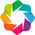

In [ ]:
import pandas as pd
from collections import defaultdict


genre_list = []
MOVIES["new_genres"].apply(lambda x: genre_list.append(ast.literal_eval(x)))
print(genre_list)

co_occurrence = defaultdict(int)

for genres in genre_list:
    for i in range(len(genres)):
        for j in range(i + 1, len(genres)):
            pair = tuple(sorted([genres[i], genres[j]])) 
            co_occurrence[pair] += 1


data = []
for (genre1, genre2), count in co_occurrence.items():
    data.append([genre1, genre2, count])

df = pd.DataFrame(data, columns=['source', 'target', 'value'])

unique_genres = list(set(df['source']).union(set(df['target'])))
genre_to_id = {genre: idx for idx, genre in enumerate(unique_genres)}

df['source_id'] = df['source'].map(genre_to_id)
df['target_id'] = df['target'].map(genre_to_id)

df = df.drop(columns=['source', 'target'])
df = df[['source_id', 'target_id', 'value']]


print("DataFrame with genre IDs:")
df = df.rename(columns={'source_id': 'source', 'target_id':'target'})


print("\nGenre to ID mapping:")

genre_df = pd.DataFrame(list(genre_to_id.items()), columns=['name', 'group'])
genre_df['group'] = genre_df['group'].apply(lambda x: int(x))

# https://python-graph-gallery.com/231-chord-diagram-with-bokeh/

import pandas as pd
import holoviews as hv
from holoviews import opts, dim
from bokeh.sampledata.les_mis import data
from bokeh.plotting import figure, output_file, save


hv.extension('bokeh')

hv.output(size=300)

nodes = hv.Dataset(genre_df, 'index')
links = df


chord = hv.Chord((links, nodes)).select(value=(5, None))
chord.opts(
    opts.Chord(cmap='Category20', edge_cmap='Category20', edge_color=dim('source').str(), 
               labels='name', node_color=dim('index').str()))


from bokeh.plotting import show
output_file('chord_plot.html', mode='inline')
save(hv.render(chord))
show(hv.render(chord))



# correlation between sentiment and theme

In [63]:
columns = ['death', 'love',
       'tragedy', 'violence', 'betrayal', 'friendship', 'happiness', 'fear',
       'revenge', 'justice', 'hope', 'family', 'fate', 'greed', 'survival',
       'transformation']
column_name = [word.capitalize() for word in columns]
colors = ['red', 'blue', 'green', 'pink'] 
unique_genre = []

fig = go.Figure()
correlation_types =["pearson","spearman"]
for c in ["pearson","spearman"]:

    corr = []
    df_temp = MOVIES[columns+['sentiment']]
    df_temp
    for theme in columns:
        corr.append(df_temp['sentiment'].corr(df_temp[theme], method=c))

    fig.add_trace(go.Bar(x=column_name, y=corr,     marker=dict(
            color=corr,
            colorscale='Viridis', 
            showscale=True,
            
        )))

fig.data[0].visible = True
fig.data[1].visible = False

dropdown_buttons = [
    dict(
        label=corr,
        method='update',
        args=[
            {'visible': [(idx==i) for i in range(len(correlation_types))]}, 
            {'title': f"Correlation: {corr}"}  
        
        ]
    )
    for idx, corr in enumerate(correlation_types)
]
fig.update_layout(updatemenus=[
        dict(
            buttons=dropdown_buttons,
            direction='down',
            showactive=True,
            x=-0.2, 
            xanchor='left',  
            y=1.1, 
            yanchor='top',  
            pad={'r': 10, 't': 10}, 
        )
    ],
    title="Correlation between theme and sentiment",
    xaxis_title="Themes",
    yaxis_title="Corrlation",
    
)
fig.show()
fig.write_html("sentiment_theme.html", auto_open=False)
